In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
import cv2
from PIL import Image
import numpy as np

from functools import partial
# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os


# Any results you write to the current directory are saved as output.

In [2]:
#os.listdir('/kaggle/input/cloud-multi-label-classification/')

In [3]:
df = pd.read_csv('/kaggle/input/cloud-multi-label-classification/MultilabelClassification.csv')

In [4]:
df

,ImageFile,Fish,Flower,Gravel,Sugar
0,0011165.jpg,1,1,0,0
1,002be4f.jpg,1,1,0,1
2,0031ae9.jpg,1,1,0,1
3,0035239.jpg,0,1,1,0
4,003994e.jpg,1,0,1,1
...,...,...,...,...,...
5541,ffcedf2.jpg,1,0,0,0
5542,ffd11b6.jpg,0,1,0,1
5543,ffd3dfb.jpg,0,0,0,1
5544,ffd6680.jpg,0,1,1,0


In [5]:
images =list(os.listdir("/kaggle/input/understanding_cloud_organization/train_images/"))

In [6]:
len(images)-4500

1046

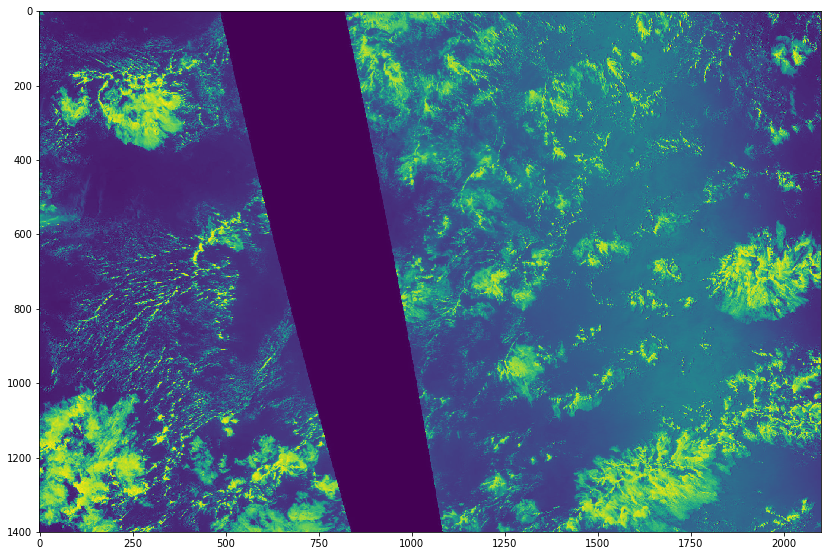

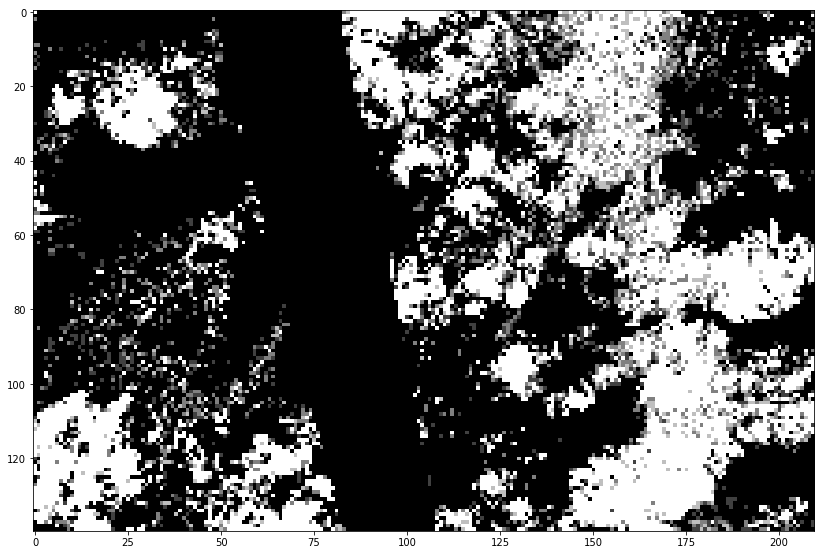

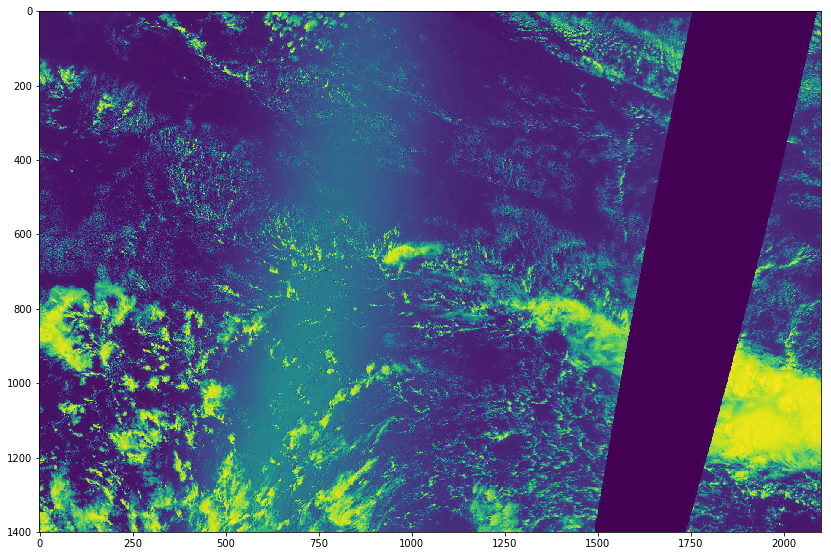

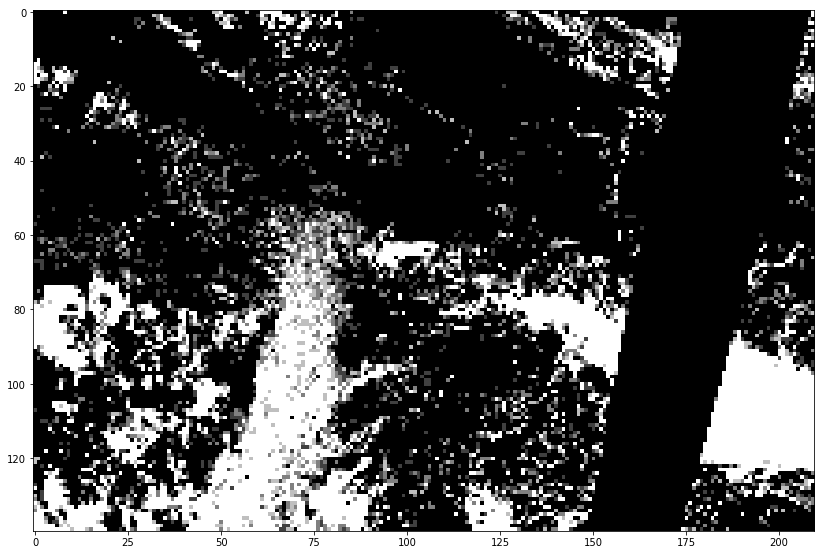

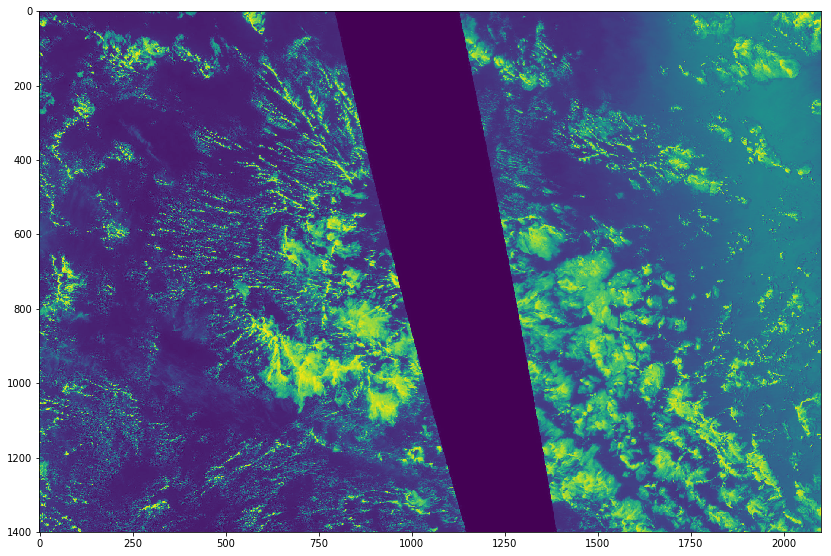

...

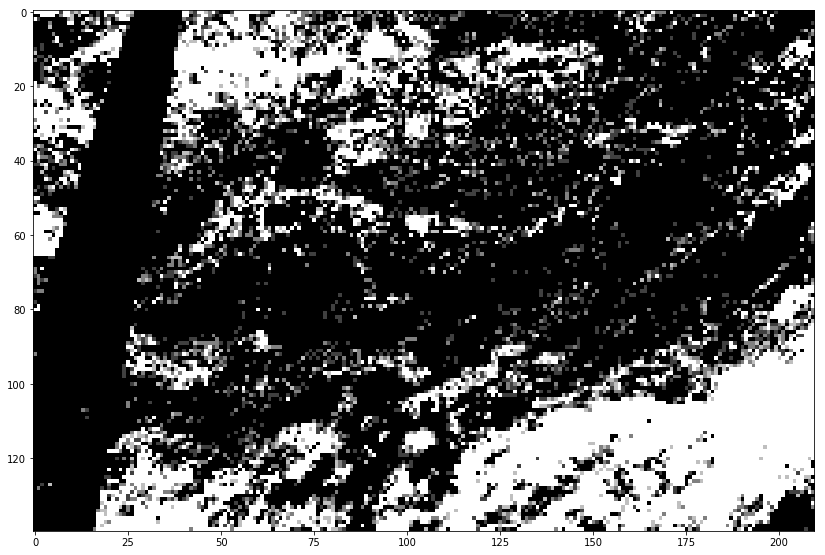

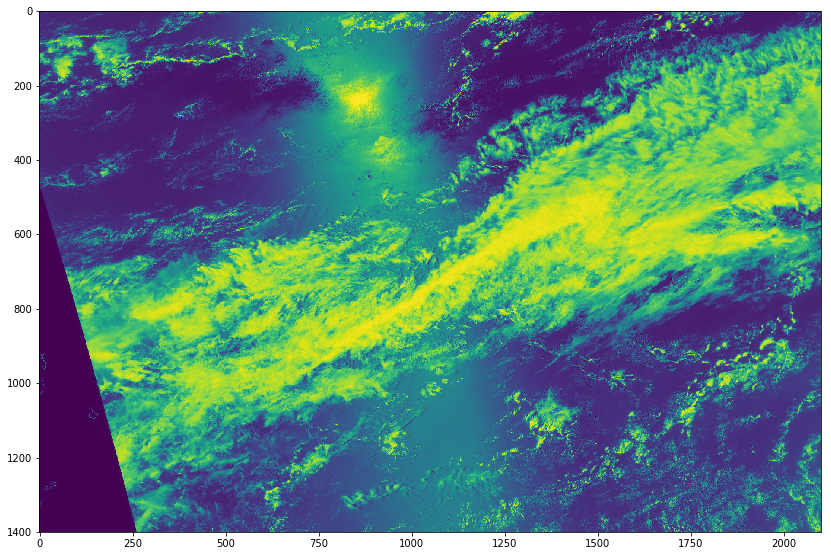

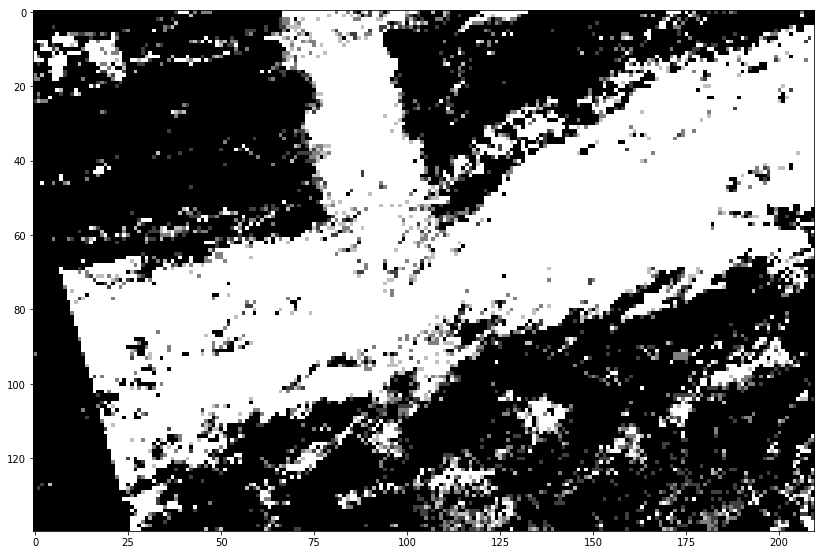

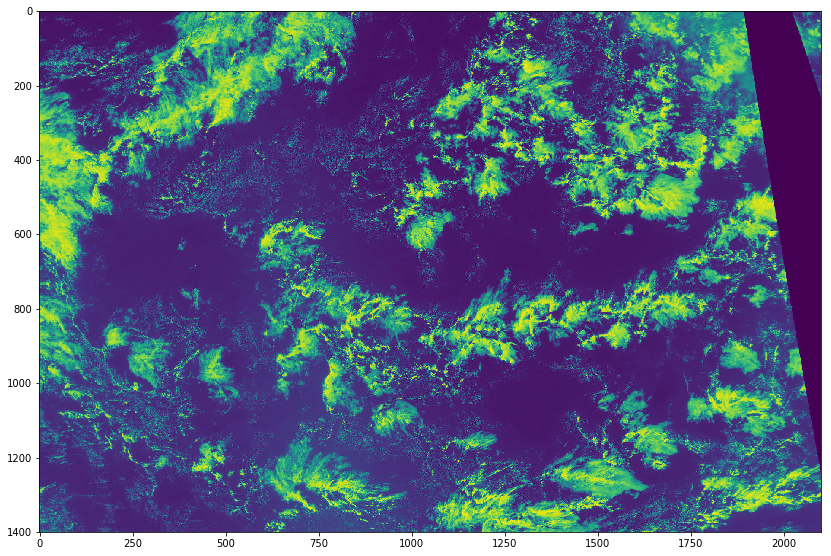

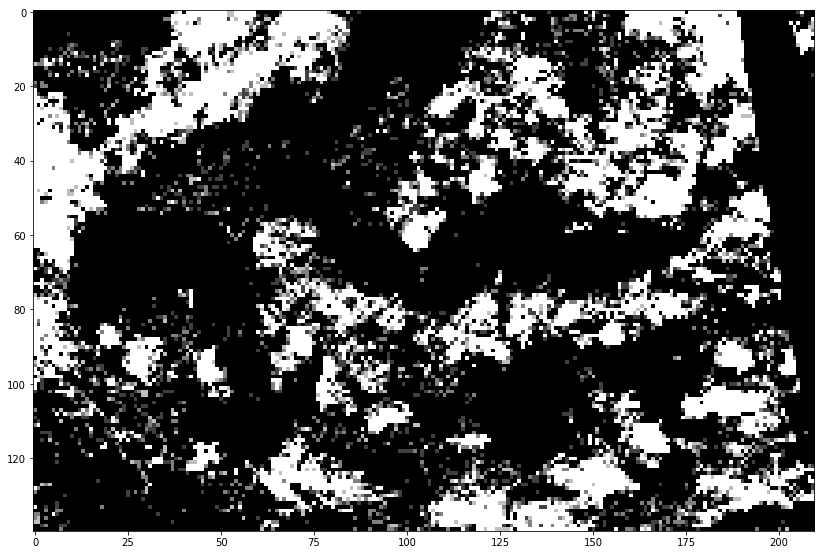

([array([1., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([0.        , 0.        , 0.25098039, ..., 1.        , 1.        ,
         1.        ]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([1., 1., 1., ..., 1., 1., 1.]),
  array([0.        , 0.        , 0.        , ..., 0.        , 0.25098039,
         1.        ]),
  array([0.        , 0.        , 0.        , ..., 0.25098039, 0.        ,
         0.        ]),
  array([1.        , 1.        , 1.        , ..., 0.25098039, 0.        ,
         0.        ]),
  array([0., 0., 0., ..., 0., 1., 1.]),
  array([0., 0., 0., ..., 0., 0., 0.])],
 [[1, 1, 0, 1],
  [0, 0, 1, 1],
  [0, 1, 0, 0],
  [1, 1, 1, 1],
  [0, 0, 1, 0],
  [0, 1, 0, 0],
  [1, 0, 1, 0],
  [0, 0, 1, 1],
  [0, 0, 1, 1],
  [1, 1, 1, 1]])

In [7]:
#4500 images for training
#1046 images for testing
import matplotlib.pyplot as plt
import matplotlib.cm as cm
%matplotlib inline

def read_images(batch_size,n,images,df,flag=0):
    x = []
    y = []
    if((n)>len(images)//batch_size):
        # invalid n
        return x , y
    # n- nth batch
    # batch_size = size of the batch being used.
    path='/kaggle/input/understanding_cloud_organization/train_images/'
    path_label = '/kaggle/input/cloud-multi-label-classification/'
    total_length_of_dataset = len(images)
    start = total_length_of_dataset - total_length_of_dataset // (n)
    end = start + batch_size
    for i in range(start,end):
        image=cv2.imread(path+'/'+images[i],0)# Reading the image
        #print(image.shape)
        ret, imgf = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        imgf=cv2.resize(imgf,(int(210),int(140)))
        imgD=np.asarray(imgf,dtype=np.float64)
        
        if(flag):
            plt.figure(figsize=(14,21))
            plt.imshow(np.asarray(image,dtype=np.float64))
            plt.show()
            plt.figure(figsize=(14,21))
            plt.imshow(imgD, cmap  =cm.gray)
            plt.show()
        #print(i)
        # Since there are errors with styles.csv, we need to extract only those images that have meta data.
        imgD /=255
        imgD = imgD.flatten()
        output = df[df['ImageFile'] == images[i]]
        if(len(output)):
            label = []
            output = output.reset_index(drop=True)
            label.append(output['Fish'][0])
            label.append(output['Flower'][0])
            label.append(output['Gravel'][0])
            label.append(output['Sugar'][0])
            x.append(imgD)
            y.append(label)
            #break
    return x,y
read_images(10,1,list(images),df,flag=1)

In [8]:

tf.reset_default_graph()

num_inputs = 210*140
layer1 = num_inputs//16
layer2 = layer1
# layer3 = layer2//4
# layer4 = layer3//4
# rev_layer3 = layer3
# rev_layer2 = layer2
#rev_layer1 = layer1
# encoded = num_inputs//256
num_outputs = num_inputs
encoded_layer1 = 114
lr = 0.01

# create_dense = partial(tf.layers.dense, activation = tf.nn.relu,
#                        kernel_initializer = tf.random_normal_initializer())
# create_final_dense = partial(tf.layers.dense,activation= tf.nn.sigmoid,
#                              kernel_initializer = tf.random_normal_initializer())

X=tf.placeholder(tf.float32,shape=[None,num_inputs],name='X')
Y=tf.placeholder(tf.float32,shape=[None,num_inputs],name='Y')

w1 = tf.Variable(tf.random_normal([num_inputs,layer1]))
w2 = tf.Variable(tf.random_normal([layer1,encoded_layer1]))
w3 = tf.Variable(tf.random_normal([encoded_layer1,layer2]))
w4 = tf.Variable(tf.random_normal([layer2,num_outputs]))
b1 =tf.Variable(tf.random_normal([layer1]))
b2 = tf.Variable(tf.random_normal([encoded_layer1]))
b3 = tf.Variable(tf.random_normal([layer2]))
b4 = tf.Variable(tf.random_normal([num_outputs]))

hidden_layer1 = tf.nn.relu(tf.add(tf.matmul(X, w1), b1))
encoded_layer = tf.nn.relu(tf.add(tf.matmul(hidden_layer1,w2),b2))
hidden_layer2 = tf.nn.relu(tf.add(tf.matmul(encoded_layer,w3),b3))
output_layer = tf.nn.sigmoid(tf.add(tf.matmul(hidden_layer2,w4),b4))


# hidden_layer1 = create_dense(inputs=X, units=layer1)
# encoded_layer = create_dense(inputs = hidden_layer1, units = encoded_layer1)
# hidden_layer2 = create_dense(inputs = encoded_layer,units = layer2)
# output_layer = create_final_dense(inputs = hidden_layer2, units = num_outputs )


# hidden_rev_layer2 =create_dense(inputs = hidden_rev_layer3, units = rev_layer2 )
# hidden_rev_layer1 = create_dense(inputs = hidden_rev_layer2, units = rev_layer1 )
# output_layer = create_dense(inputs = hidden_rev_layer1, units = num_outputs )



lam = 10**-5
mse = tf.reduce_mean(tf.square(output_layer-Y))
mse = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=output_layer , labels=Y))
contractive_loss = tf.reduce_sum(tf.square(tf.gradients(encoded_layer, X, stop_gradients = [X])))
total_loss = mse + lam*contractive_loss

# w1=tf.Variable(initializer([num_inputs,layer1]),dtype=tf.float32)
# w2=tf.Variable(initializer([layer1,layer2]),dtype=tf.float32)
# w3=tf.Variable(initializer([layer2,layer3]),dtype=tf.float32)
# w4=tf.Variable(initializer([layer3,layer4]),dtype=tf.float32)
# rev_w4 = tf.Variable(initializer([layer4,rev_layer4]),dtype=tf.float32)
# rev_w3 = tf.Variable(initializer([rev_layer4,rev_layer3]),dtype=tf.float32)
# rev_w2 = tf.Variable(initializer([rev_layer3,rev_layer2]),dtype=tf.float32)
# rev_w1 = tf.Variable(initializer([rev_layer2,rev_layer1]),dtype=tf.float32)
# output_w = tf.Variable(initializer([rev_layer1,num_outputs]),dtype=tf.float32)
# # encoded_w = tf.Variable(initializer([num_inputs,encoded]),dtype=tf.float32)
# output_w = tf.Variable(initializer([encoded,num_outputs]),dtype=tf.float32)


# # Adding bias weights
# b1=tf.Variable(tf.zeros(layer1))
# b2=tf.Variable(tf.zeros(layer2))
# b3=tf.Variable(tf.zeros(layer3))
# b4=tf.Variable(tf.zeros(layer4))
# rev_b4 = tf.Variable(tf.zeros(rev_layer4))
# rev_b3 = tf.Variable(tf.zeros(rev_layer3))
# rev_b2 = tf.Variable(tf.zeros(rev_layer2))
# rev_b1 = tf.Variable(tf.zeros(rev_layer1))
# output_b = tf.Variable(tf.zeros(num_outputs))

In [9]:
# Defining the hidden layers



In [10]:



optimizer=tf.train.AdamOptimizer(lr)
train=optimizer.minimize(total_loss)
init=tf.global_variables_initializer()
saver = tf.train.Saver(max_to_keep=2)


In [11]:
# splitting the dataset into train and test images.
import random
import time
images = set(images)
train_images = list(random.sample(images,4500))
batch_size = 180
epochs = 100
test_images = list(images.difference(train_images))
overall = dict()

In [12]:
# execution
value = []
sess = tf.Session()
sess.run(init)

print('running')
for epoch in range(epochs):
    start = time.time()
    num_batches = len(train_images)//batch_size
    print('num_batches',num_batches)
    random.shuffle(train_images)
    for i in range(num_batches):

        x_train,y_train = read_images(batch_size,i+1,train_images,df)
        sess.run(train,feed_dict={X:x_train,Y:x_train})
    mse_loss = mse.eval(session=sess,feed_dict={X:x_train,Y:x_train})
    c_loss = contractive_loss.eval(session=sess,feed_dict={X:x_train,Y:x_train})
    loss = total_loss.eval(session=sess,feed_dict={X:x_train, Y:x_train})
    print("epoch: {} batch: {} loss: {} time: {}s closs: {} mseloss(BCE): {}".format(epoch,i+1,loss,time.time()-start,c_loss,mse_loss))
    overall[epoch] = loss
    if(epoch == epochs-1):
        x,y = read_images(len(images),1,list(images),df)
        value = encoded_layer.eval(session=sess, feed_dict={X:x,Y:x})
        output = output_layer.eval(session=sess, feed_dict={X:x,Y:x})


running
num_batches 25
epoch: 0 batch: 25 loss: 538349.375 time: 130.98773002624512s closs: 53834854400.0 mseloss(BCE): 0.8594089150428772
num_batches 25
epoch: 1 batch: 25 loss: 317988.03125 time: 125.38272523880005s closs: 31798718464.0 mseloss(BCE): 0.8527331948280334
num_batches 25
epoch: 2 batch: 25 loss: 220999.046875 time: 124.68393182754517s closs: 22099820544.0 mseloss(BCE): 0.8371644020080566
num_batches 25
epoch: 3 batch: 25 loss: 170083.953125 time: 123.15855407714844s closs: 17008313344.0 mseloss(BCE): 0.8298662900924683
num_batches 25
epoch: 4 batch: 25 loss: 137055.96875 time: 126.35532522201538s closs: 13705516032.0 mseloss(BCE): 0.8182921409606934
num_batches 25
epoch: 5 batch: 25 loss: 125426.28125 time: 124.40020322799683s closs: 12542546944.0 mseloss(BCE): 0.8092535734176636
num_batches 25
epoch: 6 batch: 25 loss: 113224.328125 time: 120.32010626792908s closs: 11322352640.0 mseloss(BCE): 0.8047301769256592
num_batches 25
epoch: 7 batch: 25 loss: 96849.8125 time: 120

In [13]:
value[4000]

array([ 0.        ,  9.91674   ,  0.        ,  0.        ,  0.        ,
        0.        ,  2.107964  ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.98087156,  0.        ,  0.        ,  0.        ,  0.        ,
        1.713702  ,  0.        ,  0.        ,  5.902565  ,  1.0046334 ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        4.1822643 ,  0.        , 12.280219  ,  0.        ,  7.515991  ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        , 15.287071  ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.28674406,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        , 88.72041   ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.  

In [14]:
print(output[0])

[0. 0. 0. ... 0. 0. 1.]


In [15]:
print(x[1])

[0.         0.         0.74901961 ... 0.         0.         0.        ]


In [16]:
df['value'] = list(value)

In [17]:
df['actual'] = list(x)
df['predicted'] = list(output)

In [18]:
df.to_csv("new_file.csv",index=False)

In [19]:
sess.close()